# Satellite Image analysis

In [2]:
#import libraries
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

### Import data from './wifire/sd-3layers.jpg' and convert to numpy nd array using imread (from data library of skimage

In [6]:
from skimage import data
photo=misc.imread('./wifire/sd-3layers.jpg')
type(photo)

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


numpy.ndarray

In [10]:
# check shape of this 3 d array
photo.shape

(3725, 4797, 3)

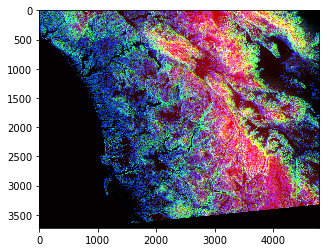

In [7]:
#plot this array using plt.figure and imshow


plt.figure()
plt.imshow(photo)


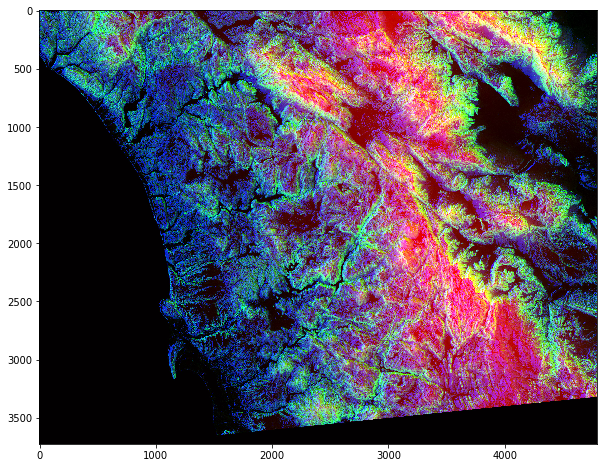

In [8]:
# resize the image to 15 width and 15 lenght
plt.figure(figsize=(10,10))
plt.imshow(photo)

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
RGB Color Mapping in the Photo:</p> <br>
<ul>
<li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold">
RED pixel indicates Altitude</p>
<li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold">
BLUE pixel indicates Aspect
</p>
<li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.


In [11]:
# check the size

photo.size

53606475

In [12]:
# find the minimum and maximum values of this 3d array and show result in a tuple

photo.min(),photo.max()

(0, 255)

In [14]:
# find the mean value
photo.mean()

75.8299354508947

In [15]:
# find the data on 150th row and 100 column

photo[150,100]

array([ 25, 149,  77], dtype=uint8)

### Set  one pixel on 150 row and 100 column=0



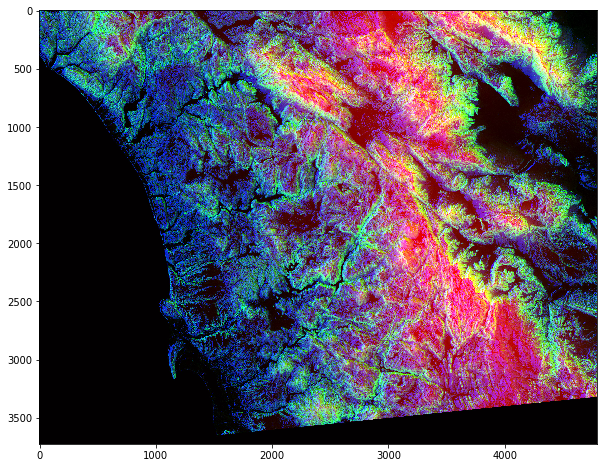

In [20]:
photo[150,100]=0
plt.figure(figsize=(10,10))
plt.imshow(photo)

### set range of pixels from row 200 to 800 , and all columns and take only the 2nd layer i,e the green layer

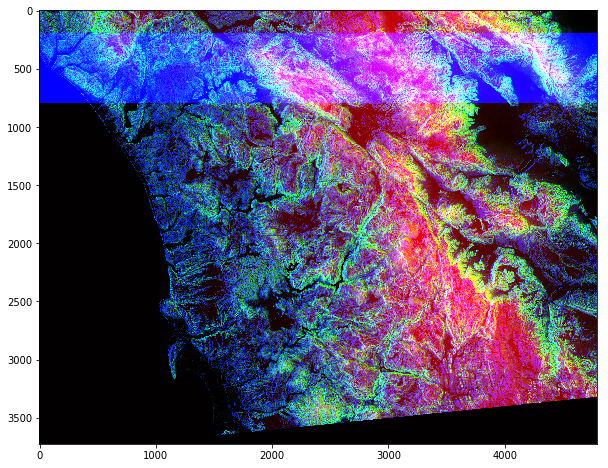

In [21]:
photo[200:800,: ,2]=255
plt.figure(figsize=(10,10))
plt.imshow(photo)

### set range of pixels from row 200 to 800 , and all columns and take only the ist layer i,e the red layer

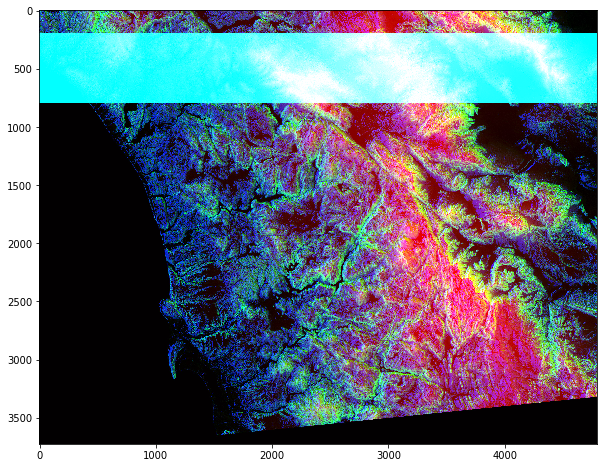

In [22]:
photo[200:800,:,1]=255
plt.figure(figsize=(10,10))
plt.imshow(photo)

### set range of rows from 200 to 800 and all columns and all layers to white

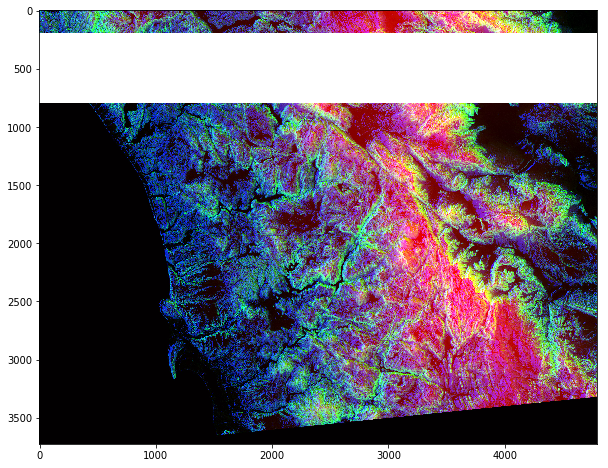

In [24]:
photo[200:800,:]=255
plt.figure(figsize=(10,10))
plt.imshow(photo)

## make a filter which has values less than 200 for all the pixels.Also check the shape of this filtered image

In [52]:
photo= misc.imread('./wifire/sd-3layers.jpg')
print('shape of normal photo =%d',photo.shape)
low_pass_filter=photo<200
print('shape of low pasd filter =%d',low_pass_filter.shape)



C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


shape of normal photo =%d (3725, 4797, 3)
shape of low pasd filter =%d (3725, 4797, 3)


### apply the low pass filter

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


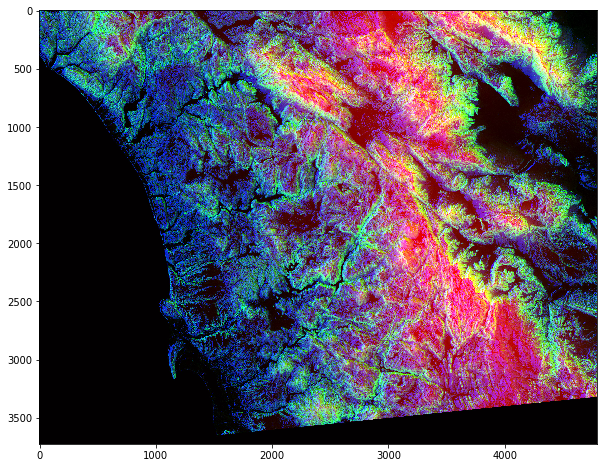

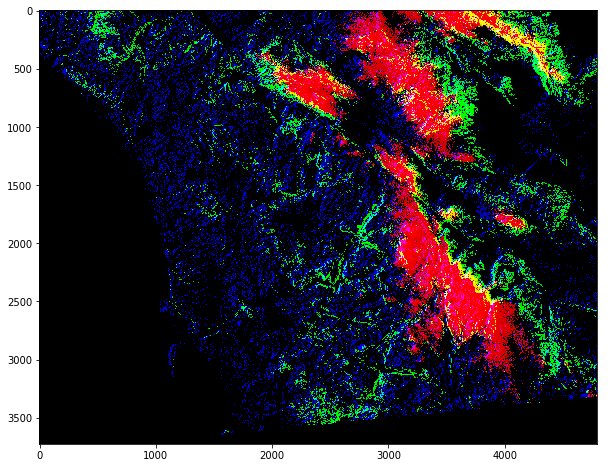

In [55]:
from skimage import data
photo=misc.imread('./wifire/sd-3layers.jpg')
plt.figure(figsize=(10,10))
plt.imshow(photo)
photo[low_pass_filter]=0
plt.figure(figsize=(10,10))
plt.imshow(photo)




# More rows and columns operartions
making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [66]:
rows_range = np.arange(len(photo))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [67]:
photo[rows_range,cols_range]=255

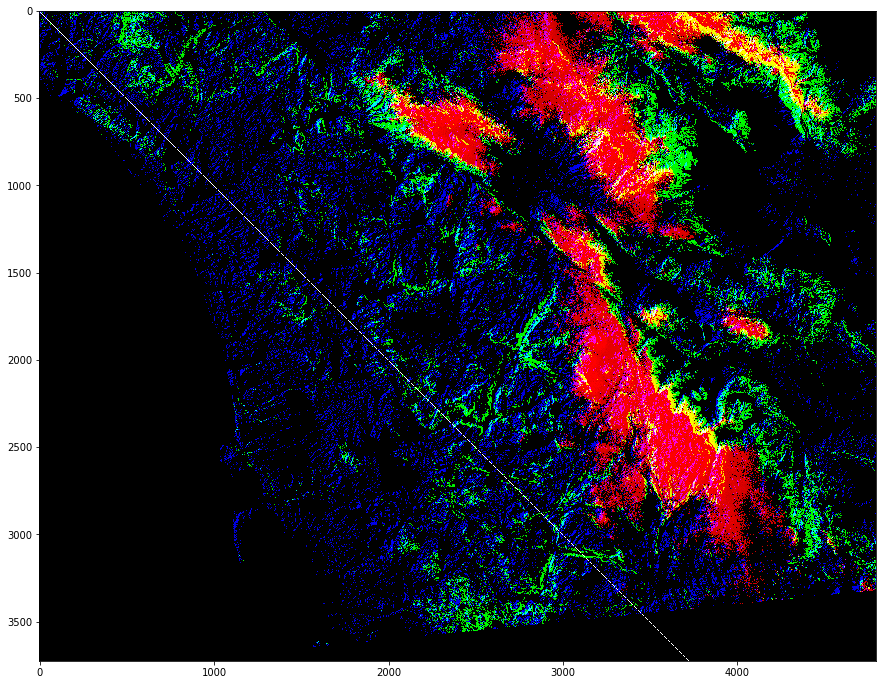

In [69]:
plt.figure(figsize=(15,15))
plt.imshow(photo)
#note in figsize=10,10 we dont see the diagonal line

### in the above fig we see the diagonal line...which is the result of above operation

# Detect highly red pixels
### make a mask with red layer less than 150 and apply this mask to the photo

In [95]:
from scipy import misc
photo=misc.imread('./wifire/sd-3layers.jpg')

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


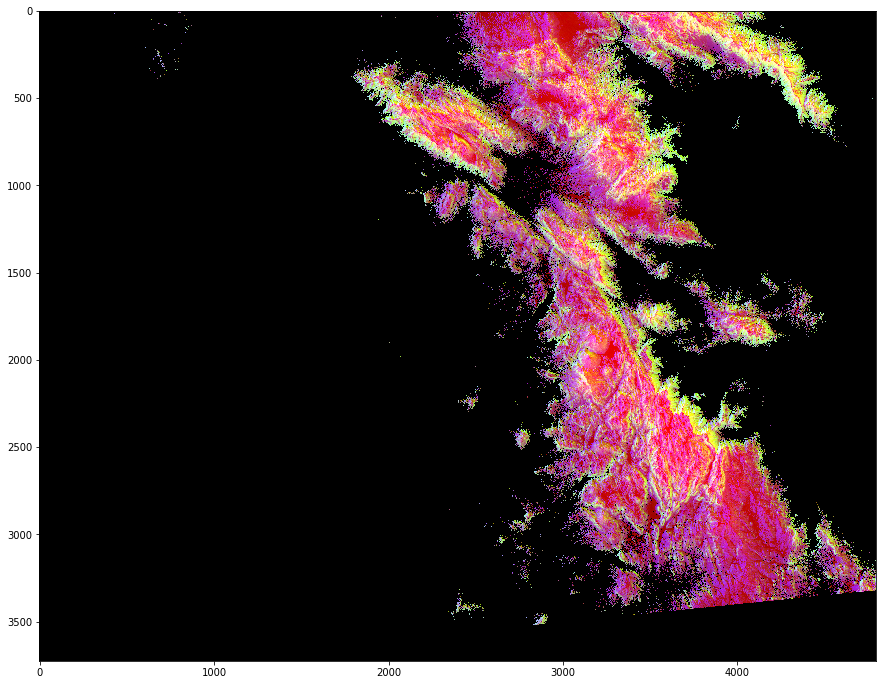

In [96]:
red_mask=photo[:,:,0]<150
photo[red_mask]=0
plt.figure(figsize=(15,15))
plt.imshow(photo)

# Detect highly green pixels
### make a mask with green layer less than 150 and apply this mask to the photo

In [97]:
from scipy import misc
photo=misc.imread('./wifire/sd-3layers.jpg')
green_mask=photo[:,:,2]<150
photo[green_mask]=0


# Detect highly blue pixels
### make a mask with blue layer less than 150 and apply this mask to the photo

In [72]:
photo=misc.imread('./wifire/sd-3layers.jpg')
type(photo)

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


numpy.ndarray

In [73]:
photo.shape

(3725, 4797, 3)

In [74]:
from scipy import misc

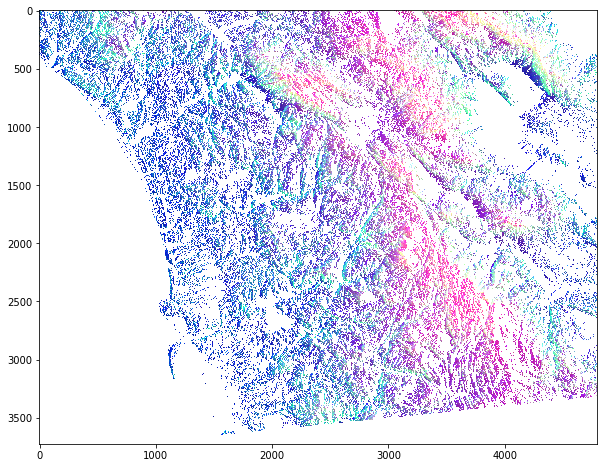

In [77]:
blue_mask=photo[:,:,2]<150
photo[blue_mask]=0
plt.figure(figsize=(10,10))
plt.imshow(photo)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

## Format a composite mask using "np.logical_and" operation
### select all rows ,cols and all 3 layers make them less than 150,more than 100,less than 100 respectively for the 3 masks i.e Red,Green and Blue
### set this mask value =0 i.e white and plot the figure

In [79]:
from scipy import misc
photo=misc.imread('./wifire/sd-3layers.jpg')
photo.shape

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


(3725, 4797, 3)

In [87]:
red_mask=photo[:,:,0]<150
green_mask=photo[:,:,1]>100
blue_mask=photo[:,:,2]<100
final_mask=np.logical_and(red_mask,green_mask,blue_mask)
photo[final_mask]=0

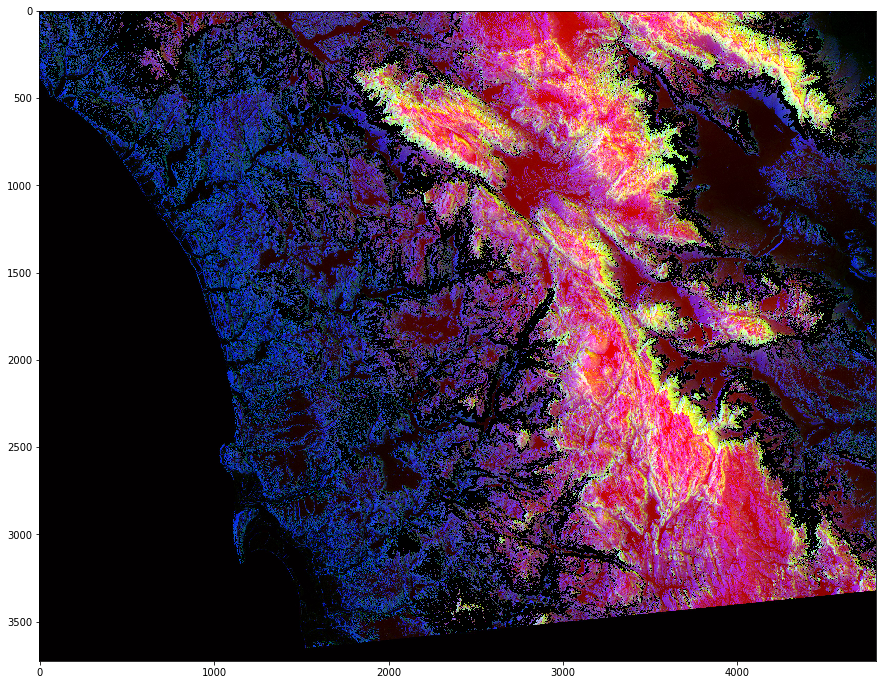

In [88]:
plt.figure(figsize=(15,15))
plt.imshow(photo)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Now let us try something even cooler...a mask that is in shape of a circular disc.

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


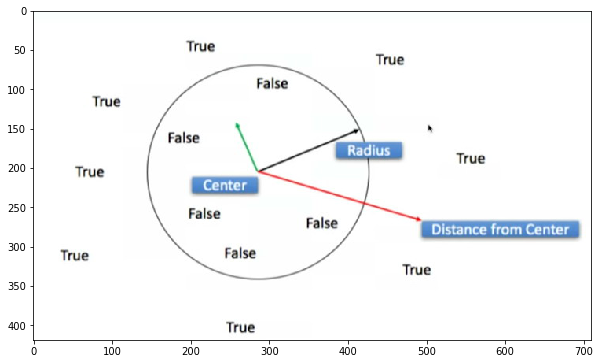

In [99]:
circle= misc.imread('./wifire/circle.jpg')

plt.figure(figsize=(10,10))
plt.imshow(circle)

So to do this, to summarize,we'll need to calculate the Euclidean distance
of all points from the center.


And if you have a triangle like this,which is the long edge of the triangle
from point  x one y one, to the center x y.The radius of the circle will be 
the Euclidean distance of any points.


So x squared y squared should be less than r squared.So how do we do this, right?

In [101]:
from numpy import ogrid
# use ogrid to vectorise the distance from the center
ogrid[0:5,0:5]

[array([[0],
        [1],
        [2],
        [3],
        [4]]), array([[0, 1, 2, 3, 4]])]

In [104]:
ogrid[:2,:3]

[array([[0],
        [1]]), array([[0, 1, 2]])]

In [105]:
ogrid[0:2,0:3]

[array([[0],
        [1]]), array([[0, 1, 2]])]

In [112]:
np.ogrid[:3]

array([0, 1, 2])

In [113]:
total_rows, total_cols, total_layers = photo.shape
print("photo = ", photo.shape)


photo =  (3725, 4797, 3)
X =  (3725, 1)  and Y =  (1, 4797)


Next now we'll use the ogrid function to help us vectorize the distance from the center,which will be a function of the two variables.

Ogrid returns as an nd-array.So what will ogrid return?
We'll give the range of total rows and range of total columns, and it's going to give us,
two vectors, x and y,
which will have, the x will have the total number of rows,like the one that we give here,
and y will have the total number of columns.

In [114]:
X, Y = np.ogrid[:total_rows, :total_cols]
print("X = ", X.shape, " and Y = ", Y.shape)

X =  (3725, 1)  and Y =  (1, 4797)


So ogrid is a compact method of creating a multidimensional nd-array operations in single lines.

In [115]:
center_row, center_col = total_rows / 2, total_cols / 2
print("center_row = ", center_row, "AND center_col = ", center_col)
print(X - center_row)
print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
print(dist_from_center)
radius = (total_rows / 2)**2
print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
#print(circular_mask)
#print(circular_mask[1500:1700,2000:2200])

center_row =  1862.5 AND center_col =  2398.5
[[-1862.5]
 [-1861.5]
 [-1860.5]
 ...
 [ 1859.5]
 [ 1860.5]
 [ 1861.5]]
[[-2398.5 -2397.5 -2396.5 ...  2395.5  2396.5  2397.5]]
[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]
Radius =  3468906.25


C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


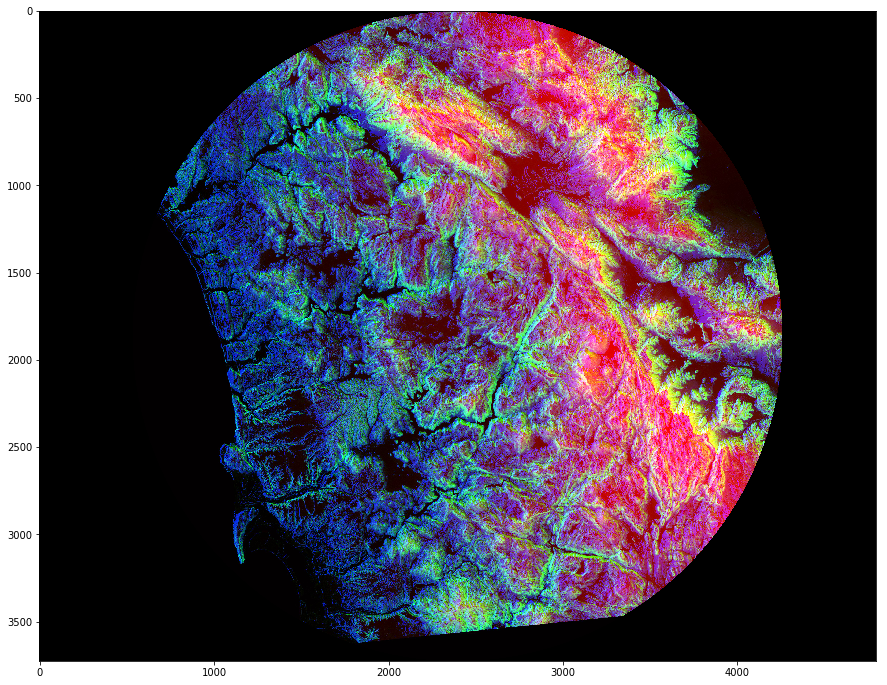

In [116]:
photo = misc.imread('./wifire/sd-3layers.jpg')
photo[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Further Masking</p>
<br/>You can further improve the mask, for example just get upper half disc.

In [117]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_mask = np.logical_and(half_upper, circular_mask)

C:\Users\New\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


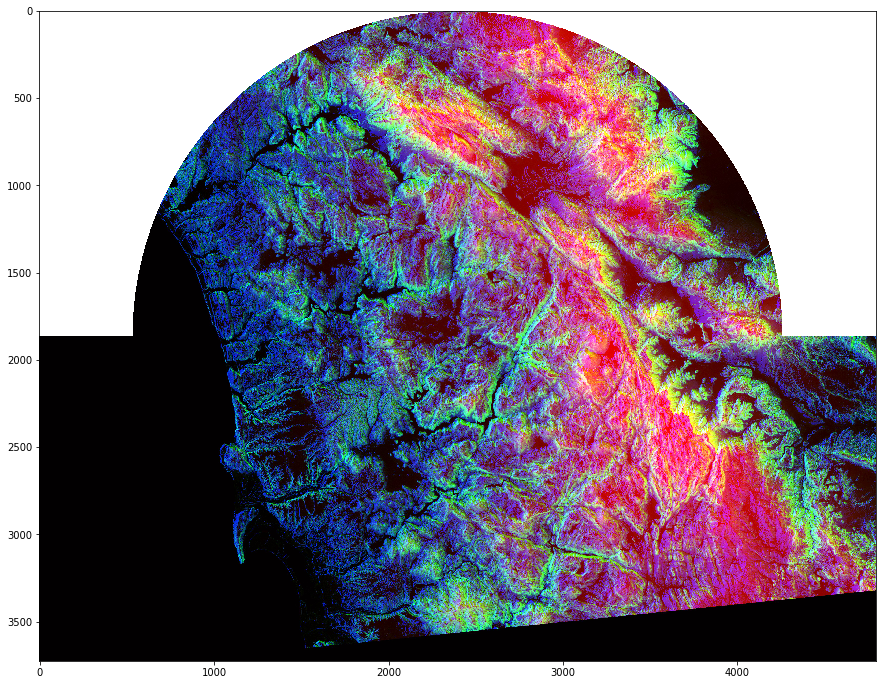

In [118]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[half_upper_mask] = 255
#photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)